In [ ]:
from pdf2image import convert_from_path
import matplotlib.pyplot as plt
from IPython.display import display
import pytesseract
from matplotlib.patches import Rectangle
import copy
import json
import os
import pandas as pd

#### **Chargement des données**

In [2]:
# Charger le PDF
pdf_path = './pdfs/doc.pdf'
images = convert_from_path(pdf_path)

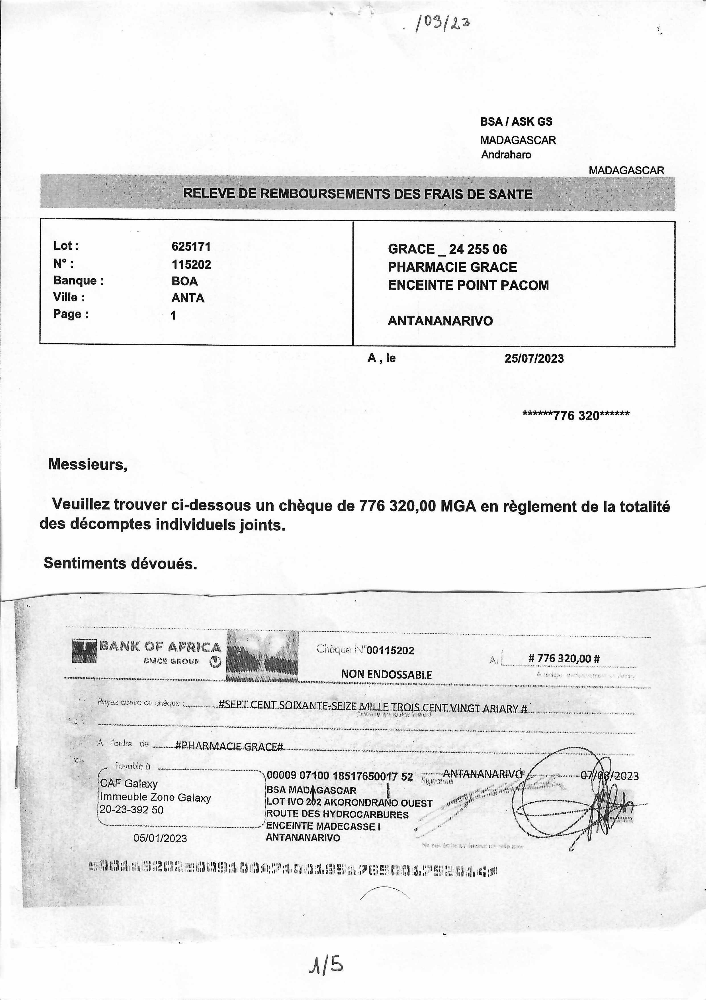

In [3]:
display(images[0])

#### **Créer une nouvelle structure**

In [40]:
struct = [
    {
        'boxes': [
            {'x': 80, 'y': 2370, 'w': 370, 'h': 130, 'c': 'r', 'col': 'Date'}, # Date
            {'x': 460, 'y': 2390, 'w': 735, 'h': 180, 'c': 'g', 'col': 'Patient'}, # Nom
            {'x': 3650, 'y': 2375, 'w': 250, 'h': 130, 'c': 'b', 'col': 'TM'}, # Ticket modérateur
            {'x': 4390, 'y': 2375, 'w': 400, 'h': 130, 'c': 'm', 'col': 'NonRembourse'}, # Non remboursé
            {'x': 3930, 'y': 2375, 'w': 400, 'h': 130, 'c': 'y', 'col': 'Rembourse'}, # Remboursé
            {'x': 2500, 'y': 2500, 'w': 1100, 'h': 130, 'c': 'c', 'col': 'Autre1'}, # Autres 1
        ],
        'decal': 385
    }
]

*Teste de la nouvelle structure*

In [41]:
# Choix de la page par l'utilisateur
group = struct[0]['boxes']
page = 2 # choix = page 2
une_image = images[page - 1]

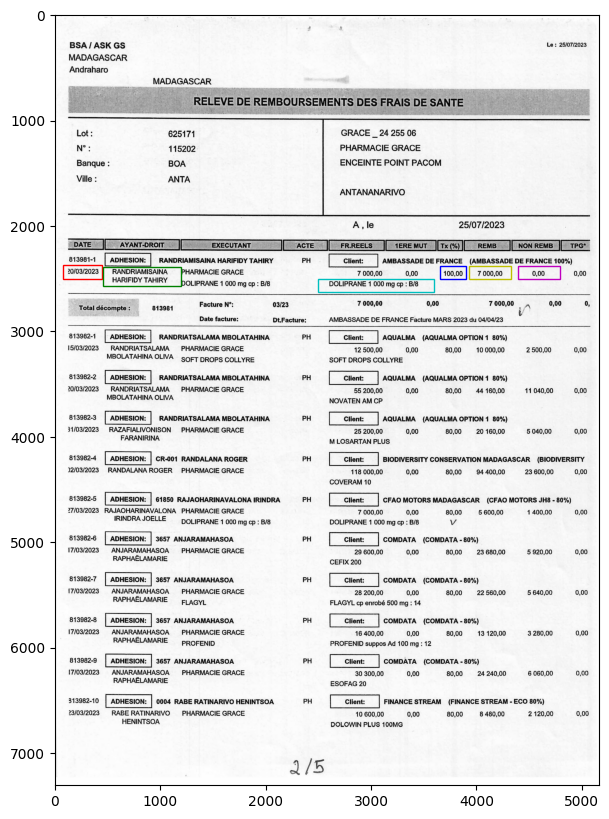

In [42]:

fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(une_image)

for box in group:
    rect = Rectangle((box['x'], box['y']), box['w'], box['h'], linewidth=1, edgecolor=box['c'], facecolor='none')
    ax.add_patch(rect)

plt.show()

*Correction des paramètres de la nouvelle structure*

*Teste OCR sur la nouvelle structure*

In [43]:
for i, box in enumerate(group):
    cropped = une_image.crop((box['x'], box['y'], box['x'] + box['w'], box['y'] + box['h']))
    text = pytesseract.image_to_string(cropped)
    print(f"{box['col']} : {text}")

Date : 20/03/2023

Patient : RANDRIAMISAINA
HARIFIDY TAHIRY

TM : 100,00

NonRembourse : 0,00

Rembourse : 7 000,00

Autre1 : DOLIPRANE 1 000 mg cp : B/8



*Enregistrer la nouvelle structure*

In [44]:
# L'utilisateur choisi le nom de la structure
nom_struct = 'bsa2'

In [45]:
struct_path = f'./structures/{nom_struct}.struct.json'

with open(struct_path, 'w') as f:
    json.dump(struct, f)

#### **Initialisation**

*Initialisation des noms de fichiers*

In [46]:
pharmacie = "grace"
assureur = "bsa"
college = "boa"
# récupérer la date du jour
aamm = "2303"

*Initialisation du fichier de données*

In [47]:
# Créer un fichier JSON vide pour stokcer ultérieurement les données extraites
data = []
nom_data = f'{pharmacie}_{assureur}_{college}_{aamm}'

with open(f'./dataout/{nom_data}.json', 'w') as f:
    json.dump(data, f)

In [48]:
print(nom_data)

grace_bsa_boa_2303


*Chargement de la structure initiale depuis l'EF*

In [49]:
# Chargement de la structure initiale depuis l'EF
jsonpath = f'./structures/bsa.struct.json'

with open(jsonpath, 'r') as f:
    init = json.load(f)
print(init)

[{'boxes': [{'x': 80, 'y': 2370, 'w': 370, 'h': 130, 'c': 'r', 'col': 'Date'}, {'x': 460, 'y': 2390, 'w': 735, 'h': 180, 'c': 'g', 'col': 'Patient'}, {'x': 3650, 'y': 2375, 'w': 250, 'h': 130, 'c': 'b', 'col': 'TM'}, {'x': 4390, 'y': 2375, 'w': 400, 'h': 130, 'c': 'm', 'col': 'NonRembourse'}, {'x': 3930, 'y': 2375, 'w': 400, 'h': 130, 'c': 'y', 'col': 'Rembourse'}, {'x': 2500, 'y': 2500, 'w': 1100, 'h': 130, 'c': 'c', 'col': 'Autre1'}], 'decal': 385}]


### **OCR Page 2**

In [50]:
page = 2

#### Création d'une LAYOUT pour la page 2

*Création de Layout Standard (à intervalles régulières, pas d'espacement particulière)*

In [51]:
layout2 = copy.deepcopy(init)

In [52]:
inter = init[0]['decal'] # espace vertical entre les groupes

In [53]:
# Nombre de lignes à ajouter pour le layout de la page 2
nbp2 = 11

for i in range(nbp2-1):
    new_group = copy.deepcopy(layout2[i])
    for box in new_group['boxes']:
        box['y'] += inter
        
    layout2.append(new_group)

*Rajouter une espacement verticale à une position particulière*

In [54]:
# L'utilisateur active ou pas l'option "décalage"

is_decal = True
dec_list_p2 = []

if is_decal:
    # L'utilisateur entre les valeurs et les positions des décalages
    dec1 = 340
    pos1 = 2
    
    dec2 = 0
    pos2 = 0

    dec3 = 0
    pos3 = 0

    # Charger la liste des décalages
    dec_list_p2 = [
        (dec1, pos1),
        (dec2, pos2),
        (dec3, pos3)
    ]

    # itérer sur les occurrences à partir de la position donnée
    for decal, pos in dec_list_p2:
        if decal > 0:
            for occur in layout2[pos-1:]:
                for box in occur['boxes']:
                    box['y'] += decal  # décaler y de chaque box

*Vérifier le décalage*

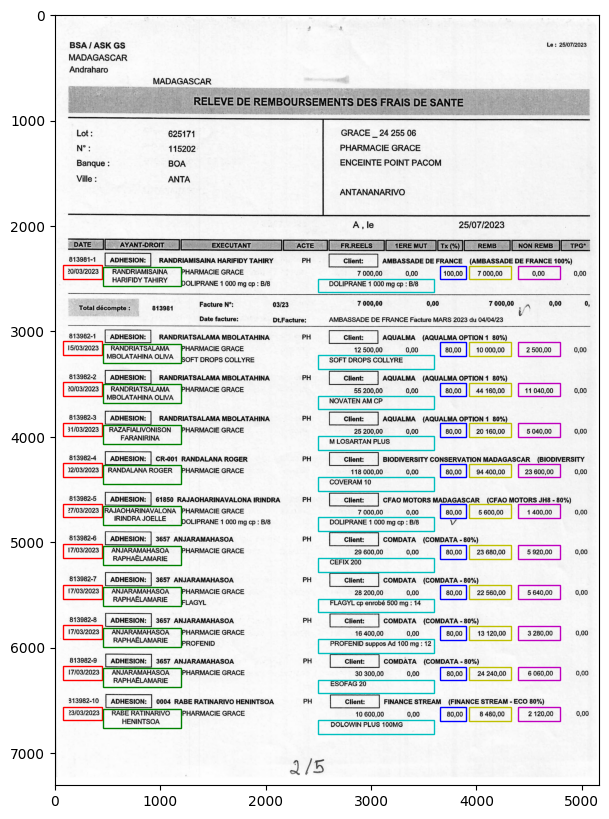

In [55]:

fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(images[page - 1])

for group in layout2:
    boxes = group['boxes']

    for box in boxes:
        rect = Rectangle((box['x'], box['y']), box['w'], box['h'], linewidth=1, edgecolor=box['c'], facecolor='none')
        ax.add_patch(rect)

plt.show()

*Enregistrer le LAYOUT*

In [56]:
posdec_nom = ''.join(str(pos) for _, pos in dec_list_p2)

# Save layout2 to a json file
layout2_nom = f'{pharmacie}_{assureur}_{college}_{aamm}_d{posdec_nom}.lay.json'

#### Extraction des données de la page 2

In [57]:
layout2_path = f'./structures/{layout2_nom}'
with open(layout2_path, 'w') as f:
    json.dump(layout2, f, indent=4)

In [58]:
data_page2 = []
for group in layout2:
    group_data = {}  # Create a dictionary to store data for the current group
    boxes = group['boxes']
    for box in boxes:
        cropped = une_image.crop((box['x'], box['y'], box['x'] + box['w'], box['y'] + box['h']))
        text = pytesseract.image_to_string(cropped)
        group_data[box['col']] = text.strip().replace("\n", " ")  # Add the field to the group dictionary
    
    data_page2.append(group_data)  # Append the group dictionary to the output list

#### Traitement des données avec Pandas

In [59]:
df_page2 = pd.DataFrame(data_page2)
df_page2.head(10)


,Date,Patient,TM,NonRembourse,Rembourse,Autre1
0,20/03/2023,RANDRIAMISAINA HARIFIDY TAHIRY,"100,00","0,00","7 000,00",DOLIPRANE 1 000 mg cp : B/8
1,15/03/2023,RANDRIATSALAMA MBOLATAHINA OLIVA,"80,00","2 500,00","10 000,00",SOFT DROPS COLLYRE
2,20/03/2023,RANDRIATSALAMA MBOLATAHINA OLIVA,"80,00","11 040,00","44 160,00",NOVATEN AM CP
3,31/03/2023,RAZAFIALIVONISON FARANIRINA,"80,00","5 040,00","20 160,00",M LOSARTAN PLUS
4,2/03/2023,RANDALANA ROGER,"80,00","23 600,00","94 400,00",COVERAM 10
5,27/03/2023,RAJAOHARINAVALONA IRINDRA JOELLE,"80,00","1 400,00","5 600,00",DOLIPRANE 1 000 mg cp : B/8
6,17/03/2023,ANJARAMAHASOA RAPHAELAMARIE,"80,00","5 920,00","23 680,00",CEFIX 200
7,17/03/2023,ANJARAMAHASOA RAPHAELAMARIE,"80,00","5 640,00","22 560,00",FLAGYL cp enrobé 500 mg : 14
8,17/03/2023,ANJARAMAHASOA RAPHAELAMARIE,"80,00","3 280,00","13 120,00",PROFENID suppos Ad 100 mg: 12
9,17/03/2023,ANJARAMAHASOA RAPHAELAMARIE,"80,00","6 060,00","24 240,00",ESOFAG 20


*Formattage des données*

In [60]:
df_page2['Page'] = page

df_page2['Date'] = pd.to_datetime(df_page2['Date'], errors='coerce', dayfirst=True)

df_page2['TM'] = df_page2['TM'].str.replace(',', '.').astype(float)

df_page2['NonRembourse'] = df_page2['NonRembourse'].str.replace(' ', '').str.replace(',', '.').astype(float)

df_page2['Rembourse'] = df_page2['Rembourse'].str.replace(' ', '').str.replace(',', '.').astype(float)

df_page2

,Date,Patient,TM,NonRembourse,Rembourse,Autre1,Page
0,2023-03-20,RANDRIAMISAINA HARIFIDY TAHIRY,100.0,0.0,7000.0,DOLIPRANE 1 000 mg cp : B/8,2
1,2023-03-15,RANDRIATSALAMA MBOLATAHINA OLIVA,80.0,2500.0,10000.0,SOFT DROPS COLLYRE,2
2,2023-03-20,RANDRIATSALAMA MBOLATAHINA OLIVA,80.0,11040.0,44160.0,NOVATEN AM CP,2
3,2023-03-31,RAZAFIALIVONISON FARANIRINA,80.0,5040.0,20160.0,M LOSARTAN PLUS,2
4,2023-03-02,RANDALANA ROGER,80.0,23600.0,94400.0,COVERAM 10,2
5,2023-03-27,RAJAOHARINAVALONA IRINDRA JOELLE,80.0,1400.0,5600.0,DOLIPRANE 1 000 mg cp : B/8,2
6,2023-03-17,ANJARAMAHASOA RAPHAELAMARIE,80.0,5920.0,23680.0,CEFIX 200,2
7,2023-03-17,ANJARAMAHASOA RAPHAELAMARIE,80.0,5640.0,22560.0,FLAGYL cp enrobé 500 mg : 14,2
8,2023-03-17,ANJARAMAHASOA RAPHAELAMARIE,80.0,3280.0,13120.0,PROFENID suppos Ad 100 mg: 12,2
9,2023-03-17,ANJARAMAHASOA RAPHAELAMARIE,80.0,6060.0,24240.0,ESOFAG 20,2


#### Sauvegarde des données traitées

In [61]:
# Sauvegarder les données dans le fichier data.json

out_path = f'./dataout/{nom_data}.json'
#output_df.to_json(out_path, orient='records', lines=True)

# Vérifier si le fichier existe et charger les données existantes

if os.path.exists(out_path):
    with open(out_path, 'r') as f:
        try:
            existing_data2 = json.load(f)
        except json.JSONDecodeError:
            existing_data2 = []  # Si le fichier est vide ou corrompu
else:
    existing_data2 = []

# Convertir les Timestamp en string avant de les ajouter
data2 = df_page2.map(lambda x:  x.strftime('%Y-%m-%d') if isinstance(x, pd.Timestamp) else x).to_dict(orient='records')

# Ajouter les nouvelles données
existing_data2.extend(data2)


# Sauvegarder les données combinées dans le fichier
# out_path2 = './dataout/data2.json'
with open(out_path, 'w') as f:
    json.dump(existing_data2, f, indent=4)

### **OCR Page 3**

In [62]:
page = 3

In [63]:
layout3 = copy.deepcopy(init)
nbpage3 = 12

In [64]:
for i in range(nbpage3-1):
    new_group = copy.deepcopy(layout3[i])
    for box in new_group['boxes']:
        box['y'] += inter
        
    layout3.append(new_group)

Remarque : Pas de rajout d'espacement particulière pour la page 3

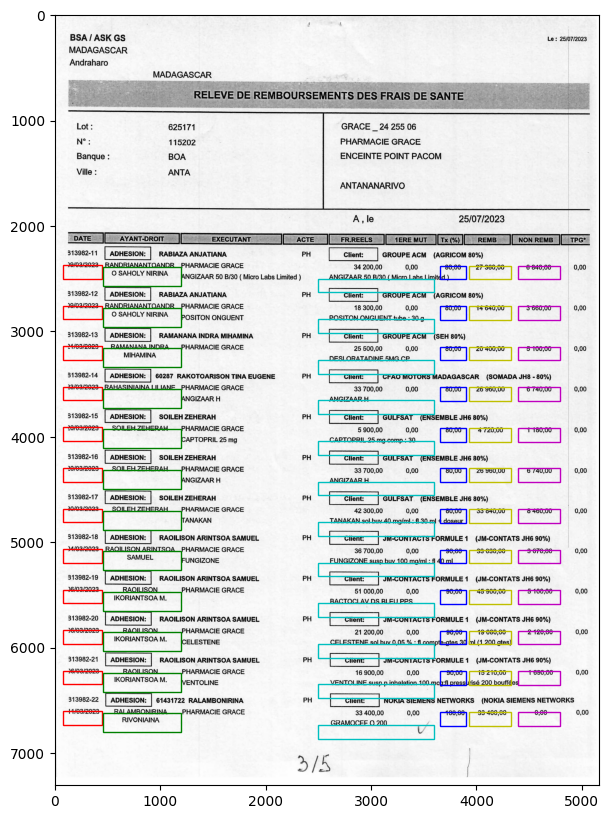

In [65]:
# Vérification de layout3
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(images[page-1])

for group in layout3:
    boxes = group['boxes']

    for box in boxes:
        rect = Rectangle((box['x'], box['y']), box['w'], box['h'], linewidth=1, edgecolor=box['c'], facecolor='none')
        ax.add_patch(rect)

plt.show()

*Ajuster la position Y du Layout de la page 3*

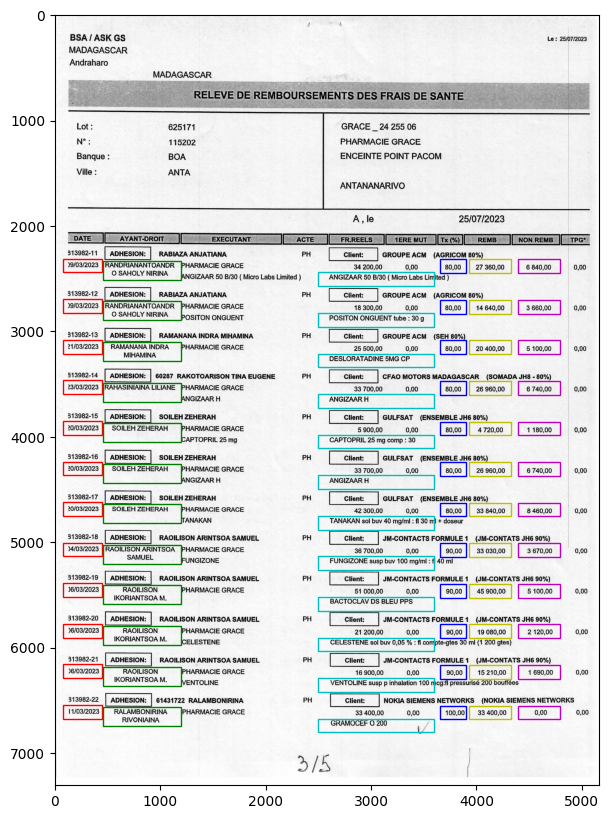

In [66]:
# Correction de layout3
decal3 = -60
#pos3 = 0

for occur in layout3:
    for box in occur['boxes']:
        box['y'] += decal3

fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(images[2])

for group in layout3:
    boxes = group['boxes']

    for box in boxes:
        rect = Rectangle((box['x'], box['y']), box['w'], box['h'], linewidth=1, edgecolor=box['c'], facecolor='none')
        ax.add_patch(rect)
plt.show()




In [67]:
# Sauvegarder layout3 dans un fichier json
output_json_path3 = './structures/layout3.json'
with open(output_json_path3, 'w') as f:
    json.dump(layout3, f, indent=4)

In [68]:
# Extraire les données de la page 3 (OCR)
data_page3 = []
for group in layout3:
    group_data = {}  # dict pour stocker les données du groupe
    boxes = group['boxes']
    for box in boxes:
        cropped = images[2].crop((box['x'], box['y'], box['x'] + box['w'], box['y'] + box['h']))
        text = pytesseract.image_to_string(cropped)
        group_data[box['col']] = text.strip().replace("\n", " ")  # Add the field to the group dictionary
    
    data_page3.append(group_data)  # Append the group dictionary to the output list

In [69]:
# Vérification des données extraites
df_page3 = pd.DataFrame(data_page3)
df_page3.head(15)

,Date,Patient,TM,NonRembourse,Rembourse,Autre1
0,9/03/2023,RANDRIANANTOANDR O SAHOLY NIRINA,"80,00","6 840,00","27 360,00",ANGIZAAR 50 B/30 ( Micro Labs Lim
1,)9/03/2023,RANDRIANANTOANDR O SAHOLY NIRINA,"80,00","3 660,00","14 640,00",POSITON ONGUENT tube : 30 g
2,21/03/2023,RAMANANA INDRA MIHAMINA,"80,00","5 100,00","20 400,00",DESLORATADINE 5MG CP
3,23/03/2023,RAHASINIAINA LILIANE,"80,00","6 740,00","26 960,00",ANGIZAAR H
4,20/03/2023,SOILEH ZEHERAH,"80,00","1 180,00","4 720,00",CAPTOPRIL 25 mg comp : 30
5,20/03/2023,SOILEH ZEHERAH,"80,00","6 740,00","26 960,00",ANGIZAAR H
6,20/03/2023,SOILEH ZEHERAH,"80,00","8 460,00","33 840,00",TANAKAN sol buv 40 mg/ml : f130 m
7,4/03/2023,RAOILISON ARINTSOA SAMUEL,"90,00","3 670,00","33 030,00",FUNGIZONE susp buv 100 mg/ml : fi
8,6/03/2023,RAOILISON IKORIANTSOA M.,"90,00","5 100,00","45 900,00",BACTOCLAV DS BLEU PPS
9,6/03/2023,RAOILISON IKORIANTSOA M.,"90,00","2 120,00","19 080,00","CELESTENE sol buv 0,05 % : flcom"


*Correction manuelle des erreurs de données*

In [70]:
# Retouche manuelle des erreurs OCR
df_page3.loc[1, "Date"] = '09/03/2023' # au lieu de )9/03/2023
print(df_page3.loc[1, "Date"])

09/03/2023


In [71]:
# Formatter les données dates et montants
df_page3['Page'] = page

df_page3['Date'] = pd.to_datetime(df_page3['Date'], errors='coerce', dayfirst=True)

df_page3['Patient'] = df_page3['Patient'].astype(str)

df_page3['NonRembourse'] = df_page3['NonRembourse'].str.replace(' ', '').str.replace(',', '.').astype(float)

df_page3['Rembourse'] = df_page3['Rembourse'].str.replace(' ', '').str.replace(',', '.').astype(float)

df_page3['TM'] = df_page3['TM'].str.replace(' ', '').str.replace(',', '.').astype(float)

df_page3

,Date,Patient,TM,NonRembourse,Rembourse,Autre1,Page
0,2023-03-09,RANDRIANANTOANDR O SAHOLY NIRINA,80.0,6840.0,27360.0,ANGIZAAR 50 B/30 ( Micro Labs Lim,3
1,2023-03-09,RANDRIANANTOANDR O SAHOLY NIRINA,80.0,3660.0,14640.0,POSITON ONGUENT tube : 30 g,3
2,2023-03-21,RAMANANA INDRA MIHAMINA,80.0,5100.0,20400.0,DESLORATADINE 5MG CP,3
3,2023-03-23,RAHASINIAINA LILIANE,80.0,6740.0,26960.0,ANGIZAAR H,3
4,2023-03-20,SOILEH ZEHERAH,80.0,1180.0,4720.0,CAPTOPRIL 25 mg comp : 30,3
5,2023-03-20,SOILEH ZEHERAH,80.0,6740.0,26960.0,ANGIZAAR H,3
6,2023-03-20,SOILEH ZEHERAH,80.0,8460.0,33840.0,TANAKAN sol buv 40 mg/ml : f130 m,3
7,2023-03-04,RAOILISON ARINTSOA SAMUEL,90.0,3670.0,33030.0,FUNGIZONE susp buv 100 mg/ml : fi,3
8,2023-03-06,RAOILISON IKORIANTSOA M.,90.0,5100.0,45900.0,BACTOCLAV DS BLEU PPS,3
9,2023-03-06,RAOILISON IKORIANTSOA M.,90.0,2120.0,19080.0,"CELESTENE sol buv 0,05 % : flcom",3


In [72]:
out_path

'./dataout/grace_bsa_boa_2303.json'

### **Sauvegarde des données combinées**

In [73]:
# Vérifier si le fichier existe et charger les données existantes

if os.path.exists(out_path):
    with open(out_path, 'r') as f:
        try:
            existing_data3 = json.load(f)
        except json.JSONDecodeError:
            existing_data3 = []  # Si le fichier est vide ou corrompu
else:
    existing_data3 = []

# Ajouter les nouvelles données
data3 = df_page3.map(lambda x: x.strftime('%Y-%m-%d') if isinstance(x, pd.Timestamp) else x).to_dict(orient='records')
existing_data3.extend(data3)

# Sauvegarder les données combinées dans une nouvelle fichier

with open(out_path, 'w') as f:
    json.dump(existing_data3, f, indent=4)

In [74]:
len(existing_data3)

23

In [2]:
# Export 'existing_data3' to excel
output_excel_path = f'./dataout/{nom_data}.xlsx'
df_combined = pd.DataFrame(existing_data3)
df_combined.to_excel(output_excel_path, index=False)

NameError: name 'nom_data' is not defined

In [76]:
print(nom_data)

grace_bsa_boa_2303
